In [1]:
pip install igraph

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# use this code in the anaconda prompt, not in jupyter notebook
#conda install -c conda-forge python-annoy
#pip install bbknn

^C


In [2]:
pip install gseapy

     |████████████████████████████████| 1.5 MB 1.7 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 964 kB 3.4 MB/s eta 0:00:01
  Using cached grequests-0.6.0-py3-none-any.whl (5.2 kB)
     |████████████████████████████████| 47 kB 5.2 MB/s eta 0:00:01
  Using cached easydev-0.12.0-py3-none-any.whl
     |████████████████████████████████| 4.6 MB 4.0 MB/s eta 0:00:01
     |████████████████████████████████| 144 kB 4.9 MB/s eta 0:00:01
  Using cached appdirs-1.4.4-py2.py3-none-any.whl (9.6 kB)
  Using cached gevent-21.12.0-cp38-cp38-macosx_10_14_x86_64.whl (1.9 MB)
  Using cached zope.interface-5.4.0-cp38-cp38-macosx_10_14_x86_64.whl (208 kB)
     |████████████████████████████████| 93 kB 2.1 MB/s eta 0:00:011
  Using cached zope.event-4.5.0-py2.py3-none-any.whl (6.8 kB)
  Using cached url_normalize-1.4.3-py2.py3-none-any.whl (6.8 kB)
  ERROR: Command errored 

Note: you may need to restart the kernel to use updated packages.


In [1]:
import bbknn

In [2]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.4 (python 3.9.12) on 2023-04-21 09:32.


In [3]:
import seaborn as sns
import matplotlib as mpl
import plotly.graph_objects as go
from pySankey.sankey import sankey
import holoviews as hv

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.3 scipy==1.8.1 pandas==1.4.2 scikit-learn==1.2.2 statsmodels==0.13.2 python-igraph==0.10.4 louvain==0.7.1 pynndescent==0.5.6


In [5]:
import os
os.chdir('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4')

In [6]:
import scanpy.external as sce

In [8]:
# all immune cells

adata_immn = sc.read('Group_ABC_after_celltype_clustering_Myel_Tcell_group_added.h5ad')

In [9]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_immn.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_immn.obs.patient).isin(cell_dict[i])
    adata_immn.obs.loc[ind,'Myeloid_to_T_cluster44'] = i

In [10]:
adata_immn.obs['crude']

AAACCTGAGTAGCCGA-1-0-0           T cell
AAACCTGCAAGAGGCT-1-0-0           T cell
AAACCTGCAGTATCTG-1-0-0           T cell
AAACCTGCATGCCTTC-1-0-0     Myeloid cell
AAACCTGGTGCCTGGT-1-0-0           T cell
                               ...     
TTTGGTTCAAGCCATT-1-24-2          T cell
TTTGGTTGTCACCCAG-1-24-2     Plasma cell
TTTGTCAAGCGCTTAT-1-24-2     Plasma cell
TTTGTCAGTCCTCTTG-1-24-2          T cell
TTTGTCAGTCTCTTTA-1-24-2          T cell
Name: crude, Length: 177304, dtype: category
Categories (6, object): ['B cell', 'Mast cell', 'Mixed', 'Myeloid cell', 'Plasma cell', 'T cell']

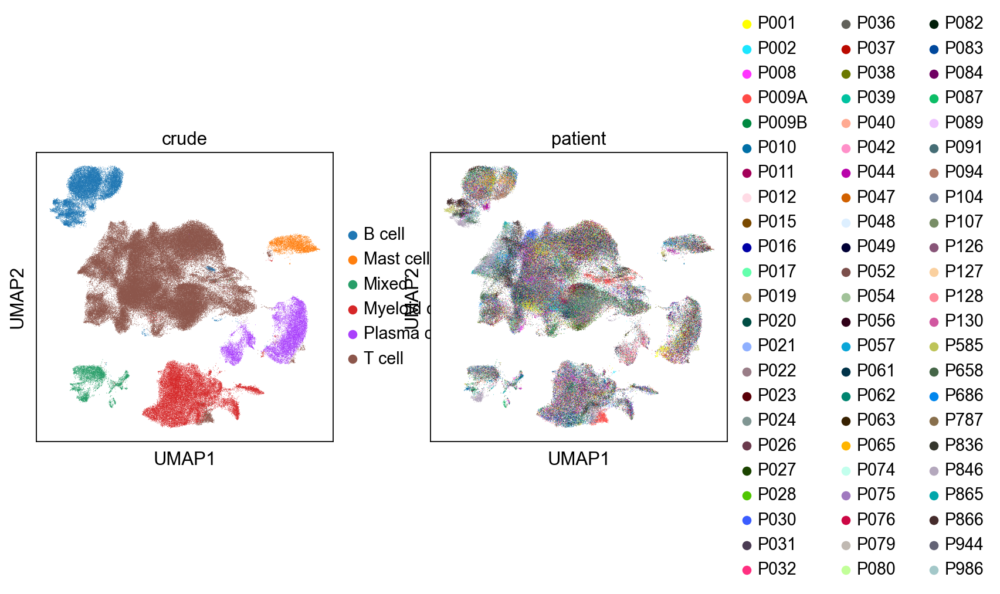

In [11]:
sc.pl.umap(adata_immn, color=['crude','patient'])

In [12]:
adata_M = adata_immn[adata_immn.obs['crude'].isin(['Mast cell'])]

In [13]:
adata_M

View of AnnData object with n_obs × n_vars = 3864 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0'

In [14]:
pd.crosstab(adata_M.obs['Myeloid_to_T_cluster44'], adata_M.obs['Myeloid_to_T_cluster44'])

Myeloid_to_T_cluster44,M1toT1,M1toT2,M1toT4,M2toT1,M2toT3,M3toT1,M3toT2,M3toT4,M4toT1,M4toT2,M4toT4
Myeloid_to_T_cluster44,,,,,,,,,,,
M1toT1,206,0,0,0,0,0,0,0,0,0,0
M1toT2,0,387,0,0,0,0,0,0,0,0,0
M1toT4,0,0,326,0,0,0,0,0,0,0,0
M2toT1,0,0,0,173,0,0,0,0,0,0,0
M2toT3,0,0,0,0,1,0,0,0,0,0,0
M3toT1,0,0,0,0,0,838,0,0,0,0,0
M3toT2,0,0,0,0,0,0,1051,0,0,0,0
M3toT4,0,0,0,0,0,0,0,238,0,0,0
M4toT1,0,0,0,0,0,0,0,0,423,0,0


In [15]:
adata_M.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,n_counts,celltype,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44
CGTCTACCATCGTCGG-1-7-0,496.0,476,747.801697,19.655413,2.628426,tumor,P787,16,0,72.949989,...,747.801697,16,Mast cell,Mast cell,Group A,Dinh dataset,NaN,T_3,Myeloid_2,M2toT3
AAAGATGTCTGAGGGA-1-10-0,3177.0,3019,2291.458008,26.286131,1.147136,tumor,P126,16,0,159.761200,...,2291.458008,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_4,M4toT1
AACACGTAGTCCAGGA-1-10-0,2185.0,2113,2092.047363,23.786852,1.137013,tumor,P126,16,0,176.967957,...,2092.047363,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_4,M4toT1
ACTGTCCAGGATTCGG-1-10-0,2635.0,2532,2257.051270,18.876163,0.836320,tumor,P126,16,0,153.085693,...,2257.051270,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_4,M4toT1
ACTTTCATCTTTAGTC-1-10-0,1922.0,1839,1874.717285,38.101334,2.032377,tumor,P126,16,0,173.439301,...,1874.717285,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_4,M4toT1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTTCTCGAGCCACCTG-1-24-2,483.0,464,882.485107,22.747355,2.577647,tumor,P001,16,2,114.535217,...,882.485107,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1
TCGAGGCGTCAACATC-1-24-2,1768.0,1698,1579.346802,19.025505,1.204644,tumor,P001,16,2,157.416824,...,1579.346802,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1
TGTCCCACATGGGACA-1-24-2,1878.0,1800,1572.309692,13.924111,0.885583,tumor,P001,16,2,134.977615,...,1572.309692,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1
TTCTTAGAGGTGCTAG-1-24-2,395.0,377,772.250854,34.941856,4.524677,tumor,P001,16,2,92.642113,...,772.250854,16,Mast cell,Mast cell,Group A,Zhang dataset,NaN,T_1,Myeloid_3,M3toT1


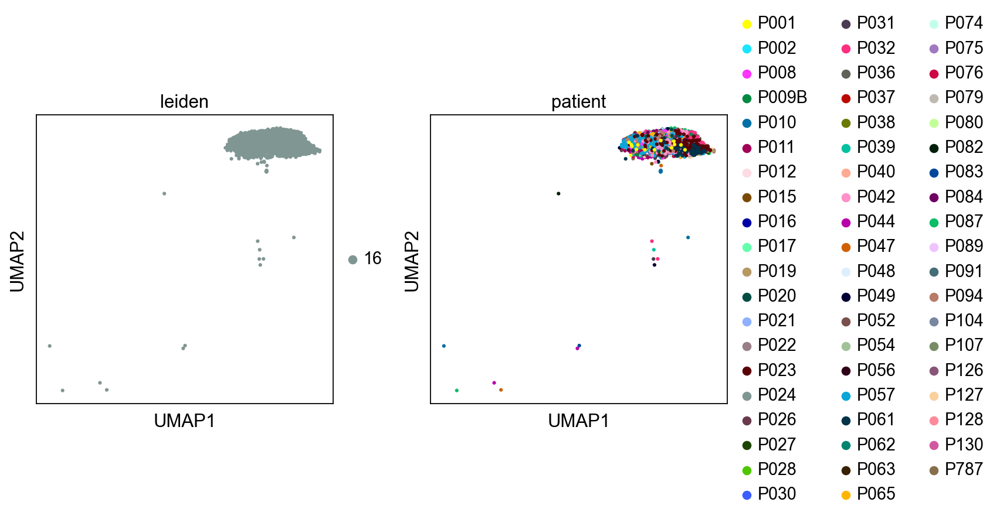

In [18]:
sc.pl.umap(adata_M, color=['leiden','patient'])

In [19]:
#sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata_M, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_M, max_value=10)
sc.tl.pca(adata_M, svd_solver='arpack')
sc.pp.neighbors(adata_M, n_neighbors=10, n_pcs=20)
#sc.tl.louvain(adata_M)
#sc.tl.umap(adata_M)

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:01:37)
computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_patient']`


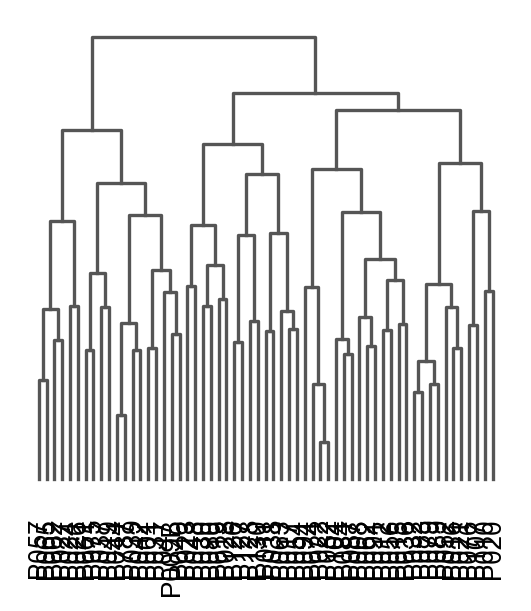

<AxesSubplot:>

In [20]:
# dendrogram after converting mouse gene to human gene
sc.tl.dendrogram(adata_M, 'patient')
sc.pl.dendrogram(adata_M, 'patient')

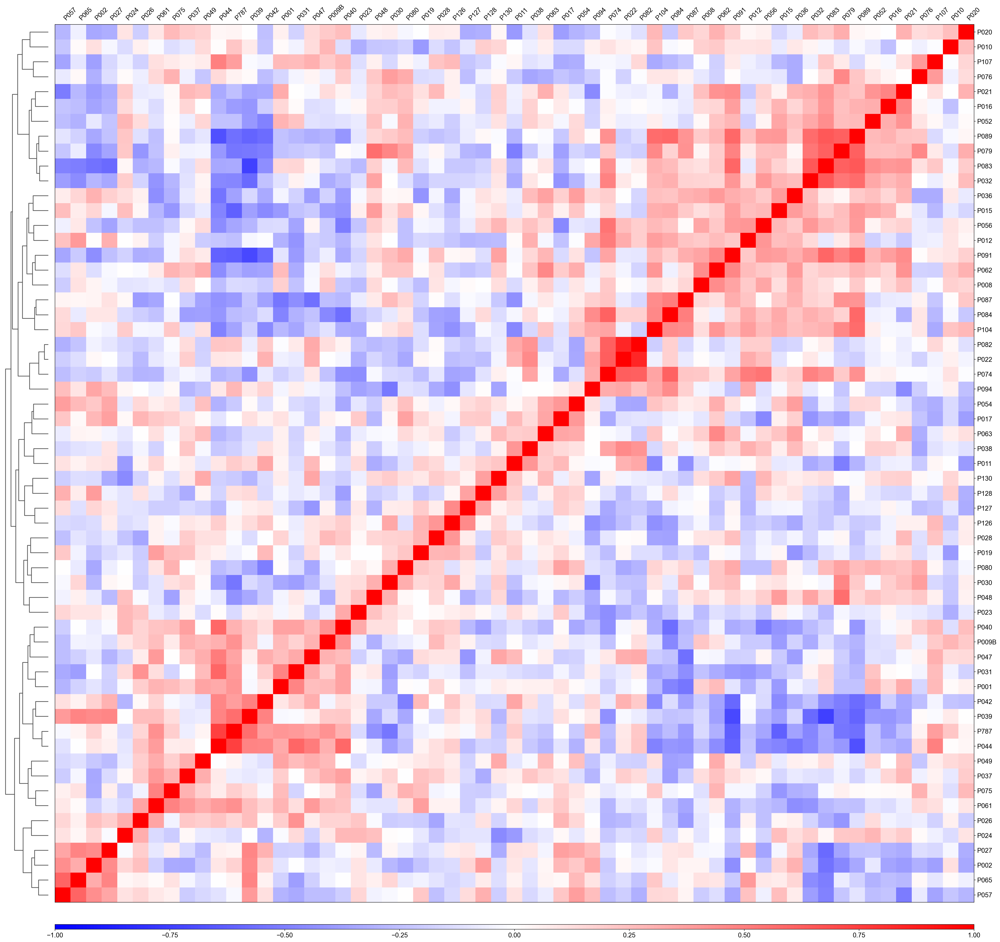

In [21]:
sc.pl.correlation_matrix(adata_M, groupby='patient')

In [22]:
adata_M

AnnData object with n_obs × n_vars = 3864 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cel

In [23]:
#previous data (not sorted 1~11)
#sc.pl.dotplot(adata, ['CCR2'], groupby='patient', use_raw=False)

In [24]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata_M, 'batch')
'X_pca_harmony' in adata_M.obsm
True

2023-04-21 09:43:21,321 - harmonypy - INFO - Iteration 1 of 10
2023-04-21 09:43:23,066 - harmonypy - INFO - Iteration 2 of 10
2023-04-21 09:43:24,799 - harmonypy - INFO - Iteration 3 of 10
2023-04-21 09:43:26,538 - harmonypy - INFO - Iteration 4 of 10
2023-04-21 09:43:27,572 - harmonypy - INFO - Iteration 5 of 10
2023-04-21 09:43:28,641 - harmonypy - INFO - Iteration 6 of 10
2023-04-21 09:43:29,610 - harmonypy - INFO - Iteration 7 of 10
2023-04-21 09:43:30,469 - harmonypy - INFO - Iteration 8 of 10
2023-04-21 09:43:31,328 - harmonypy - INFO - Iteration 9 of 10
2023-04-21 09:43:32,174 - harmonypy - INFO - Iteration 10 of 10
2023-04-21 09:43:33,036 - harmonypy - INFO - Stopped before convergence


True

In [25]:
adata_M.obsm['X_pca'] = adata_M.obsm['X_pca_harmony']
sc.pp.neighbors(adata_M)
sc.tl.pca(adata_M)
sc.tl.umap(adata_M)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


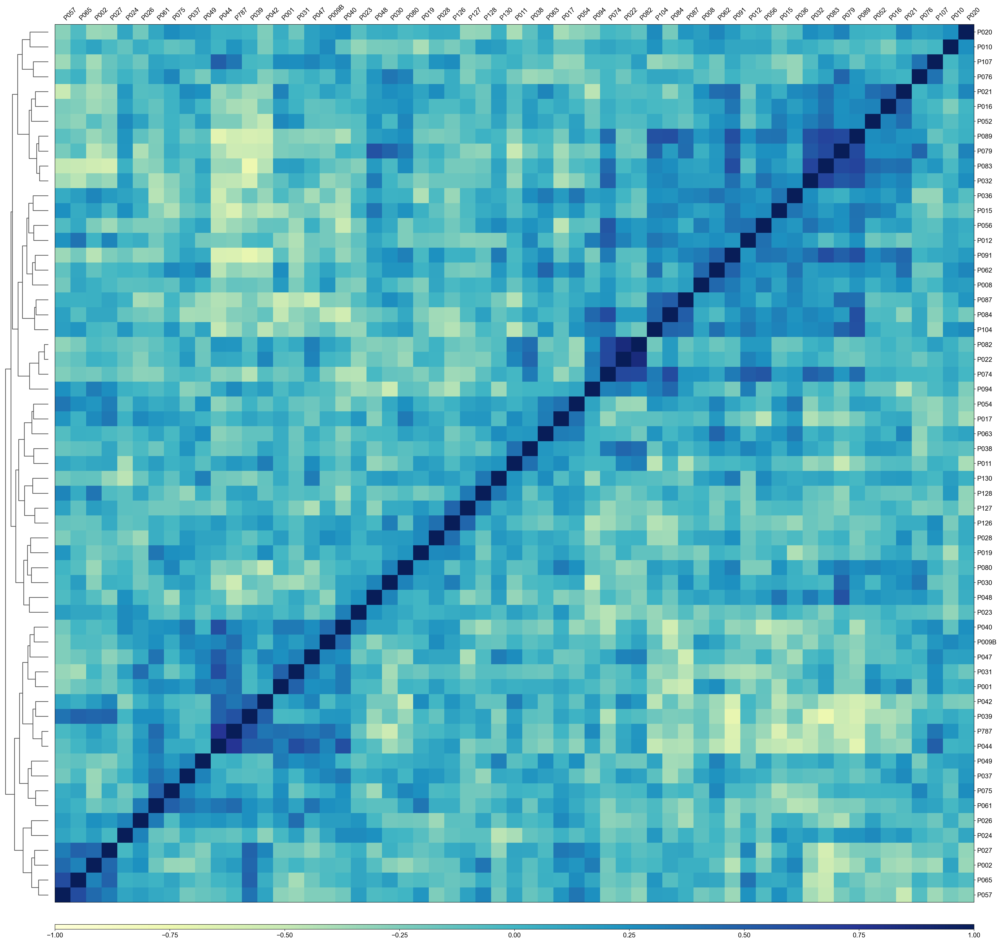

In [26]:
sc.pl.correlation_matrix(adata_M, groupby='patient',cmap='YlGnBu', save='_Mast_cell_GroupABC_correlation_matrix.pdf')

In [27]:
sc.pp.neighbors(adata_M)
sc.tl.umap(adata_M)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


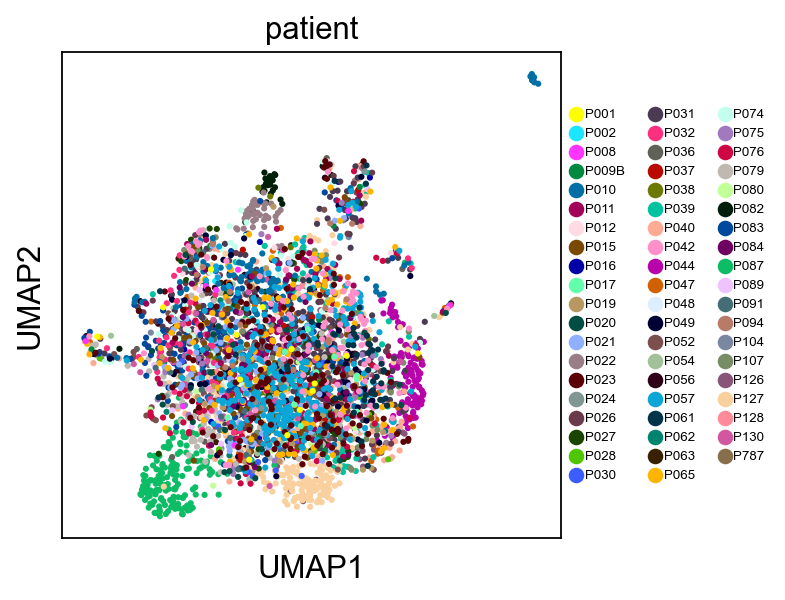

In [28]:
sc.pl.umap(adata_M, color=['patient'], legend_loc='right margin', legend_fontsize=6, save='umap_patient_cluster_in_Mast_cell.pdf')

# Check

# did not proceed further

In [23]:
#sc.pl.umap(adata, color=['patient'], save='umap_Group_A_patient_immune.pdf')

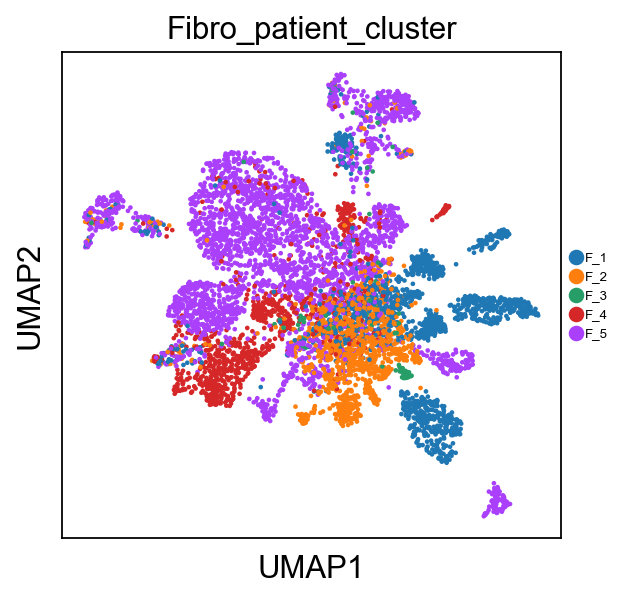

In [17]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Mast_1': ['P083','P032','P107','P024','P036','P074','P089','P038','P019','P128','P082','P130','P015',
                          'P022','P030','P079'],
             'Mast_2': ['P054','P062','P027','P061','P048','P052','P042','P023','P084','P127','P012','P028','P039','P026',
                          'P063','P017','P040','P021','P049','P021','P049'],
             'Mast_3': ['P020','P080','P126','P002','P016'],
             'Mast_4':['P001','P037','P031','P787','P944','P051','P866','P181','P686','P846','P658','P986','P585'],
             'Mast_5':['P094','P065','P008','P087','P009A','P057','P104','P075','P076','P011','P056','P047','P044','P091','P010','P009B']
              }

# Initialize empty column in cell metadata
adata_M.obs['Fibro_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_M.obs.patient).isin(cell_dict[i])
    adata_M.obs.loc[ind,'Fibro_patient_cluster'] = i

sc.pl.umap(adata_M, color=['Fibro_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_Fibro_patient_cluster_in_Fibroblast.pdf')


In [32]:
pd.crosstab(adata_M.obs['Fibro_patient_cluster'], adata_M.obs['Fibro_patient_cluster'])

Fibro_patient_cluster,F_1,F_2,F_3,F_4,F_5
Fibro_patient_cluster,,,,,
F_1,1526,0,0,0,0
F_2,0,1091,0,0,0
F_3,0,0,97,0,0
F_4,0,0,0,1017,0
F_5,0,0,0,0,3122


In [19]:
adata_M.obs['patient'].cat.reorder_categories(['P001','P002','P008','P009A','P009B','P010','P011','P012','P015','P016','P017',
                                             'P019','P020','P021','P022','P023','P024','P026','P027','P028','P030','P031','P032',
                                             'P036','P037','P038','P039','P040','P042','P044','P047','P048','P049',
                                            'P051','P052','P054','P056','P057','P061','P062','P063','P065','P074','P075','P076',
                                             'P079','P080','P082','P083','P084','P087','P089','P091','P094','P104','P107','P126',
                                             'P127','P128','P130','P181','P585','P658','P686','P787','P846','P866','P944','P986'
                                             ],inplace=True)
adata_M.obs['patient']

AACCGCGCATCATCCC-1-0-0     P686
ACCTTTATCATGTCTT-1-0-0     P686
ACGGCCAGTCTAAAGA-1-0-0     P686
CCCTCCTGTCTGCAAT-1-0-0     P686
CTACCCAGTCCAACTA-1-0-0     P686
                           ... 
GATCGATGTGACGGTA-1-24-2    P001
GGCTGGTGTGATAAAC-1-24-2    P001
GTAACTGGTTATGCGT-1-24-2    P001
GTTTCTATCCACTGGG-1-24-2    P001
TGGCGCAAGGCTATCT-1-24-2    P001
Name: patient, Length: 6853, dtype: category
Categories (69, object): ['P001', 'P002', 'P008', 'P009A', ..., 'P846', 'P866', 'P944', 'P986']

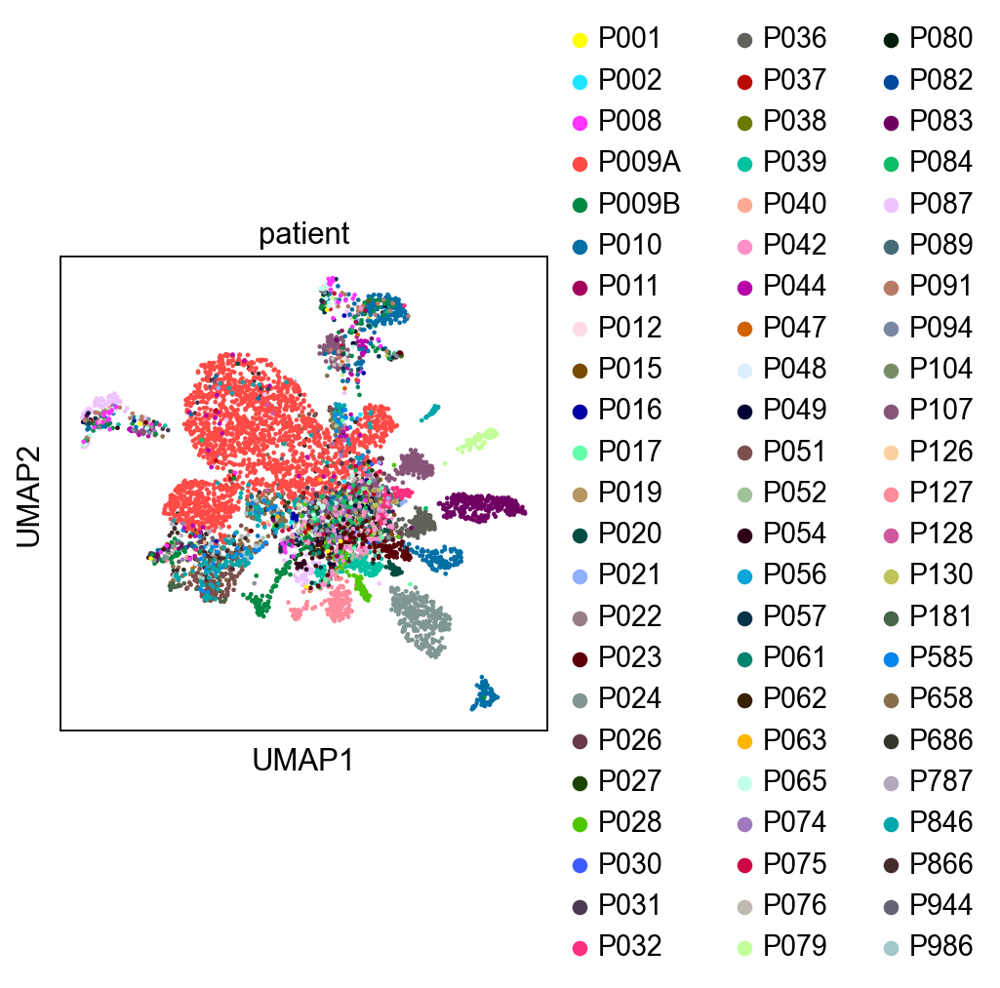

In [20]:
sc.pl.umap(adata_M, color=['patient'], save='Fibroblast_Group_ABC_patient_immune-modified.pdf')

In [35]:
adata_M.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,louvain,batch,total_counts_ribo,...,celltype,crude,celltype_detail,patient_cluster,T_patient_cluster,Myeloid_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,Fibro_patient_cluster
AACCGCGCATCATCCC-1-0-0,295.0,292,602.010742,28.894253,4.799624,tumor,P686,16,0,37.823494,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
ACCTTTATCATGTCTT-1-0-0,318.0,311,632.084656,24.674427,3.903659,tumor,P686,16,0,119.910477,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
ACGGCCAGTCTAAAGA-1-0-0,307.0,300,633.546448,36.759792,5.802225,tumor,P686,16,0,111.540718,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
CCCTCCTGTCTGCAAT-1-0-0,358.0,349,674.543945,29.242657,4.335175,tumor,P686,16,0,151.970200,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
CTACCCAGTCCAACTA-1-0-0,541.0,532,876.320068,29.598692,3.377612,tumor,P686,16,0,94.352737,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GATCGATGTGACGGTA-1-24-2,4585.0,4456,2012.406860,21.289864,1.057930,tumor,P001,16,2,144.295151,...,Fibroblast_2,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4
GGCTGGTGTGATAAAC-1-24-2,946.0,876,1246.637817,0.000000,0.000000,tumor,P001,10,2,147.837402,...,Fibroblast_1,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4
GTAACTGGTTATGCGT-1-24-2,4478.0,3979,1715.034302,11.984035,0.698764,tumor,P001,10,2,110.068214,...,Fibroblast_1,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4
GTTTCTATCCACTGGG-1-24-2,1843.0,1626,1487.885864,28.594776,1.921839,tumor,P001,10,2,138.539597,...,Fibroblast_1,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4


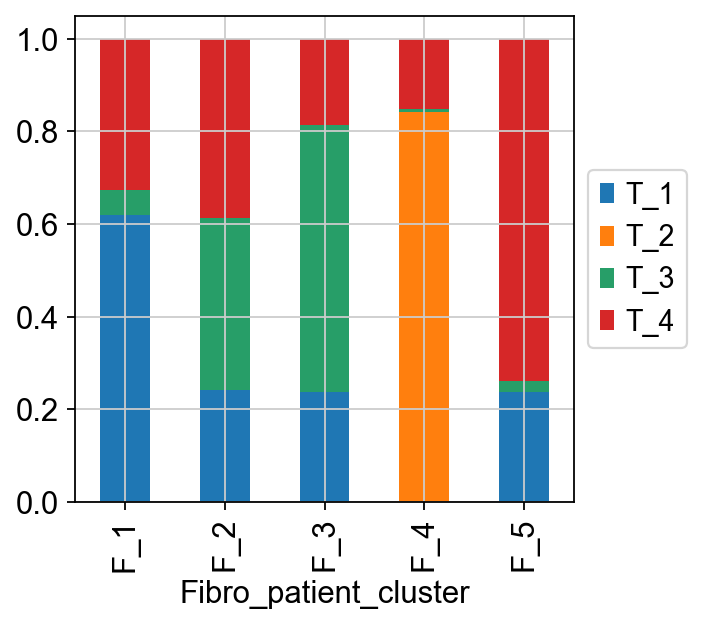

In [38]:
tmp = pd.crosstab(adata_M.obs['Fibro_patient_cluster'],adata_M.obs['T_patient_cluster4'], normalize='index')
ax = tmp.plot.bar(stacked=True).legend(loc='center left', bbox_to_anchor=(1.0, 0.5)).get_figure()

ax.savefig('Fibroblast_stacked_bar.pdf')

In [64]:
pd.crosstab(adata_M.obs['Fibro_patient_cluster'],adata_M.obs['T_patient_cluster4'])

T_patient_cluster4,T_1,T_2,T_3,T_4
Fibro_patient_cluster,,,,
F_1,946,0,82,498
F_2,264,0,404,423
F_3,23,0,56,18
F_4,0,856,6,155
F_5,744,0,68,2310


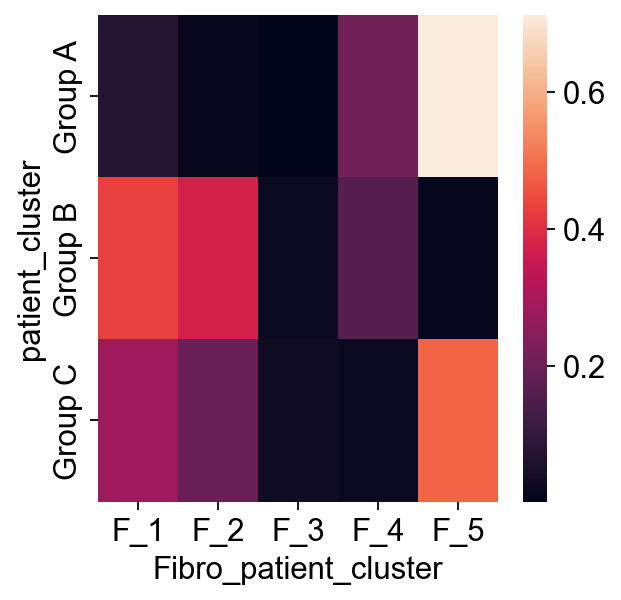

In [40]:
svm = sns.heatmap(pd.crosstab(adata_M.obs["patient_cluster"], adata_M.obs["Fibro_patient_cluster"], normalize="index"))
svm.figure.savefig('heatmap_tumor_group_to_T_cell.pdf', dpi=400)

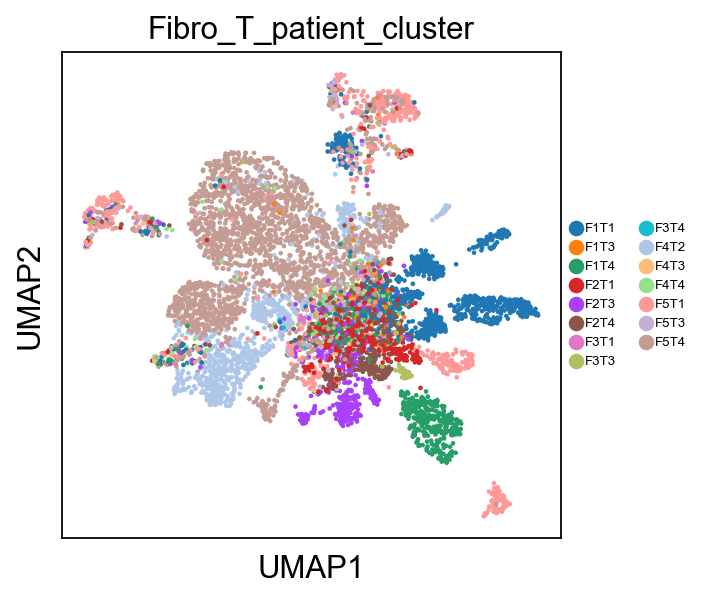

In [12]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'F1T1': ['P036','P079','P083','P089','P107','P019','P032'],
             'F1T2':[],
             'F1T3':['P128','P015','P030','P130'],
             'F1T4':['P022','P028','P038','P082','P074','P024'],
            
             'F2T1': ['P054','P017','P021','P023','P084'],
            'F2T2': [],
             'F2T3':['P063','P012','P027','P028','P048','P062','P127','P049','P061'],
             'F2T4':['P040','P026','P039','P052','P042'],
 
             'F3T1': ['P016'],
             'F3T2':[],
             'F3T3':['P020','P126','P002',],
             'F3T4':['P080'],
             
             'F4T1':[],
             'F4T2':['P787','P944','P051','P866','P181','P686','P846','P658','P986','P585'],
             'F4T3':['P001'],
             'F4T4':['P037','P031'],
             
            'F5T1':['P087','P104','P076','P008','P010','P094'],
             'F5T2':[],
             'F5T3':['P056','P057','P065'],
             'F5T4':['P009A','P044','P047','P009B','P011','P075','P091']
             
              }

# Initialize empty column in cell metadata
adata_M.obs['Fibro_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_M.obs.patient).isin(cell_dict[i])
    adata_M.obs.loc[ind,'Fibro_T_patient_cluster'] = i

sc.pl.umap(adata_M, color=['Fibro_T_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_Fibro_T_patient_cluster_in_Fibroblast.pdf')


In [16]:
adata_M.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,louvain,batch,total_counts_ribo,...,crude,celltype_detail,patient_cluster,T_patient_cluster,Myeloid_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,Fibro_patient_cluster,Fibro_T_patient_cluster
AACCGCGCATCATCCC-1-0-0,295.0,292,602.010742,28.894253,4.799624,tumor,P686,16,0,37.823494,...,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,NaN,F4T2
ACCTTTATCATGTCTT-1-0-0,318.0,311,632.084656,24.674427,3.903659,tumor,P686,16,0,119.910477,...,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,NaN,F4T2
ACGGCCAGTCTAAAGA-1-0-0,307.0,300,633.546448,36.759792,5.802225,tumor,P686,16,0,111.540718,...,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,NaN,F4T2
CCCTCCTGTCTGCAAT-1-0-0,358.0,349,674.543945,29.242657,4.335175,tumor,P686,16,0,151.970200,...,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,NaN,F4T2
CTACCCAGTCCAACTA-1-0-0,541.0,532,876.320068,29.598692,3.377612,tumor,P686,16,0,94.352737,...,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,NaN,F4T2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GATCGATGTGACGGTA-1-24-2,4585.0,4456,2012.406860,21.289864,1.057930,tumor,P001,16,2,144.295151,...,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,NaN,F4T3
GGCTGGTGTGATAAAC-1-24-2,946.0,876,1246.637817,0.000000,0.000000,tumor,P001,10,2,147.837402,...,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,NaN,F4T3
GTAACTGGTTATGCGT-1-24-2,4478.0,3979,1715.034302,11.984035,0.698764,tumor,P001,10,2,110.068214,...,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,NaN,F4T3
GTTTCTATCCACTGGG-1-24-2,1843.0,1626,1487.885864,28.594776,1.921839,tumor,P001,10,2,138.539597,...,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,NaN,F4T3


In [41]:
adata_M.write('Fibroblast_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [8]:
#adata_M = sc.read('Fibroblast_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [8]:
df_7 = pd.crosstab(adata_M.obs['patient'],adata_M.obs['patient_cluster'], normalize='index')
df_7

patient_cluster,Group A,Group B,Group C
patient,,,
P063,1.0,0.0,0.0
P056,1.0,0.0,0.0
P009B,0.0,0.0,1.0
P075,0.0,0.0,1.0
P011,0.0,0.0,1.0
...,...,...,...
P028,0.0,1.0,0.0
P039,0.0,1.0,0.0
P020,0.0,0.0,1.0


In [9]:
df_8 = pd.crosstab(adata_M.obs['patient'],adata_M.obs['T_patient_cluster4'], normalize='index')
df_8

T_patient_cluster4,T_1,T_2,T_3,T_4
patient,,,,
P063,0.0,0.0,1.0,0.0
P056,0.0,0.0,1.0,0.0
P009B,0.0,0.0,0.0,1.0
P075,0.0,0.0,0.0,1.0
P011,0.0,0.0,0.0,1.0
...,...,...,...,...
P028,0.0,0.0,1.0,0.0
P039,0.0,0.0,0.0,1.0
P020,0.0,0.0,1.0,0.0


In [10]:
df_9 = pd.crosstab(adata_M.obs['patient'],adata_M.obs['Myeloid_patient_cluster4'], normalize='index')
df_9

Myeloid_patient_cluster4,Myeloid_1,Myeloid_2,Myeloid_3,Myeloid_4
patient,,,,
P063,1.0,0.0,0.0,0.0
P056,1.0,0.0,0.0,0.0
P009B,1.0,0.0,0.0,0.0
P075,1.0,0.0,0.0,0.0
P011,1.0,0.0,0.0,0.0
...,...,...,...,...
P030,0.0,0.0,0.0,1.0
P028,0.0,0.0,0.0,1.0
P039,0.0,0.0,0.0,1.0


In [11]:
df_10 = pd.crosstab(adata_M.obs['patient'],adata_M.obs['Fibro_patient_cluster'], normalize='index')
df_10

Fibro_patient_cluster,F_1,F_2,F_3,F_4,F_5
patient,,,,,
P063,0.0,1.0,0.0,0.0,0.0
P056,0.0,0.0,0.0,0.0,1.0
P009B,0.0,0.0,0.0,0.0,1.0
P075,0.0,0.0,0.0,0.0,1.0
P011,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...
P028,0.0,1.0,0.0,0.0,0.0
P039,0.0,1.0,0.0,0.0,0.0
P020,0.0,0.0,1.0,0.0,0.0


In [12]:
df_11 = pd.concat([df_7,df_8, df_9, df_10], axis=1)
df_11

,Group A,Group B,Group C,T_1,T_2,T_3,T_4,Myeloid_1,Myeloid_2,Myeloid_3,Myeloid_4,F_1,F_2,F_3,F_4,F_5
patient,,,,,,,,,,,,,,,,
P063,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
P056,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
P009B,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
P075,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
P011,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P028,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
P039,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
P020,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [13]:
df_11.to_csv('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/patient_T_Myeloid_fibro_groups.csv')

In [14]:
# loading data made from 3 T cell classes and 3 Myeloid cell classes
#adata = sc.read('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell/GroupABC_integrated/T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

# Sankey plot with Fibroblast cells only

In [15]:
df = pd.DataFrame(adata_M.obs)
df

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,louvain,batch,total_counts_ribo,...,celltype,crude,celltype_detail,patient_cluster,T_patient_cluster,Myeloid_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,Fibro_patient_cluster
AACCGCGCATCATCCC-1-0-0,295.0,292,602.010742,28.894253,4.799624,tumor,P686,16,0,37.823494,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
ACCTTTATCATGTCTT-1-0-0,318.0,311,632.084656,24.674427,3.903659,tumor,P686,16,0,119.910477,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
ACGGCCAGTCTAAAGA-1-0-0,307.0,300,633.546448,36.759792,5.802225,tumor,P686,16,0,111.540718,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
CCCTCCTGTCTGCAAT-1-0-0,358.0,349,674.543945,29.242657,4.335175,tumor,P686,16,0,151.970200,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
CTACCCAGTCCAACTA-1-0-0,541.0,532,876.320068,29.598692,3.377612,tumor,P686,16,0,94.352737,...,Fibroblast_2,Fibroblast,Fibroblast,Group A,T_1,Myeloid_1,T_2,Myeloid_2,M2toT2,F_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GATCGATGTGACGGTA-1-24-2,4585.0,4456,2012.406860,21.289864,1.057930,tumor,P001,16,2,144.295151,...,Fibroblast_2,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4
GGCTGGTGTGATAAAC-1-24-2,946.0,876,1246.637817,0.000000,0.000000,tumor,P001,10,2,147.837402,...,Fibroblast_1,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4
GTAACTGGTTATGCGT-1-24-2,4478.0,3979,1715.034302,11.984035,0.698764,tumor,P001,10,2,110.068214,...,Fibroblast_1,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4
GTTTCTATCCACTGGG-1-24-2,1843.0,1626,1487.885864,28.594776,1.921839,tumor,P001,10,2,138.539597,...,Fibroblast_1,Fibroblast,Fibroblast,Group C,T_2,Myeloid_2,T_3,Myeloid_3,M3toT3,F_4


In [16]:
print (df.dtypes)

n_genes                      float64
n_genes_by_counts              int32
total_counts                 float32
total_counts_mt              float32
pct_counts_mt                float32
tissue                      category
patient                     category
louvain                     category
batch                       category
total_counts_ribo            float32
pct_counts_ribo              float32
total_counts_hb              float32
pct_counts_hb                float32
percent_mt2                  float32
n_counts                     float32
celltype                    category
crude                       category
celltype_detail             category
patient_cluster             category
T_patient_cluster           category
Myeloid_patient_cluster     category
T_patient_cluster4          category
Myeloid_patient_cluster4    category
Myeloid_to_T_cluster44      category
Fibro_patient_cluster       category
dtype: object


In [17]:
df['patient'] = df['patient'].astype(object)
df['crude'] = df['crude'].astype(object)
df['louvain'] = df['louvain'].astype(object)
df['patient_cluster'] = df['patient_cluster'].astype(object)
df['T_patient_cluster'] = df['T_patient_cluster'].astype(object)
df['T_patient_cluster4'] = df['T_patient_cluster4'].astype(object)
df['Fibro_patient_cluster'] = df['Fibro_patient_cluster'].astype(object)
df['celltype'] = df['celltype'].astype(object)
df['batch'] = df['batch'].astype(object)


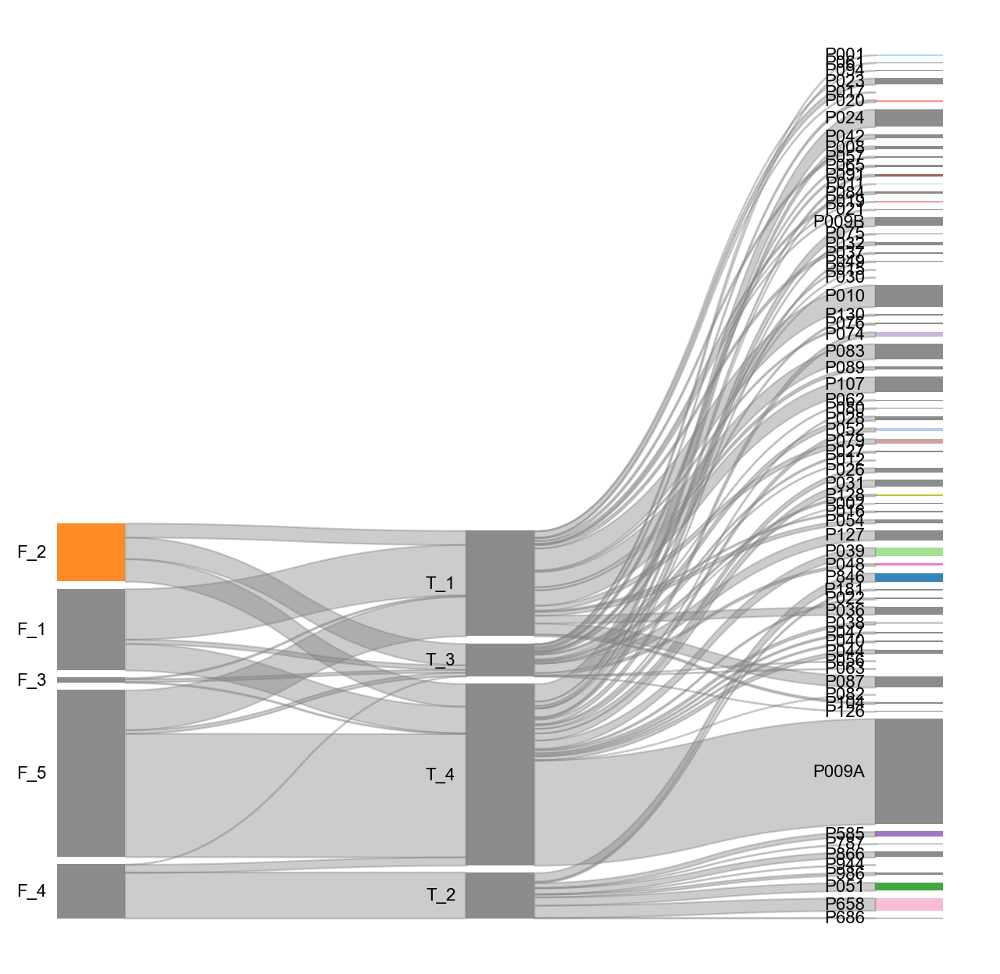

In [18]:
#pySnakey2 package
# for multilayer dataframe
import matplotlib.pyplot as plt
import pandas as pd
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf
from pysankey2 import Sankey

df_1 = df[['Fibro_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("Fibro_group_tumor_group_comparison.pdf", bbox_inches="tight", dpi=300)

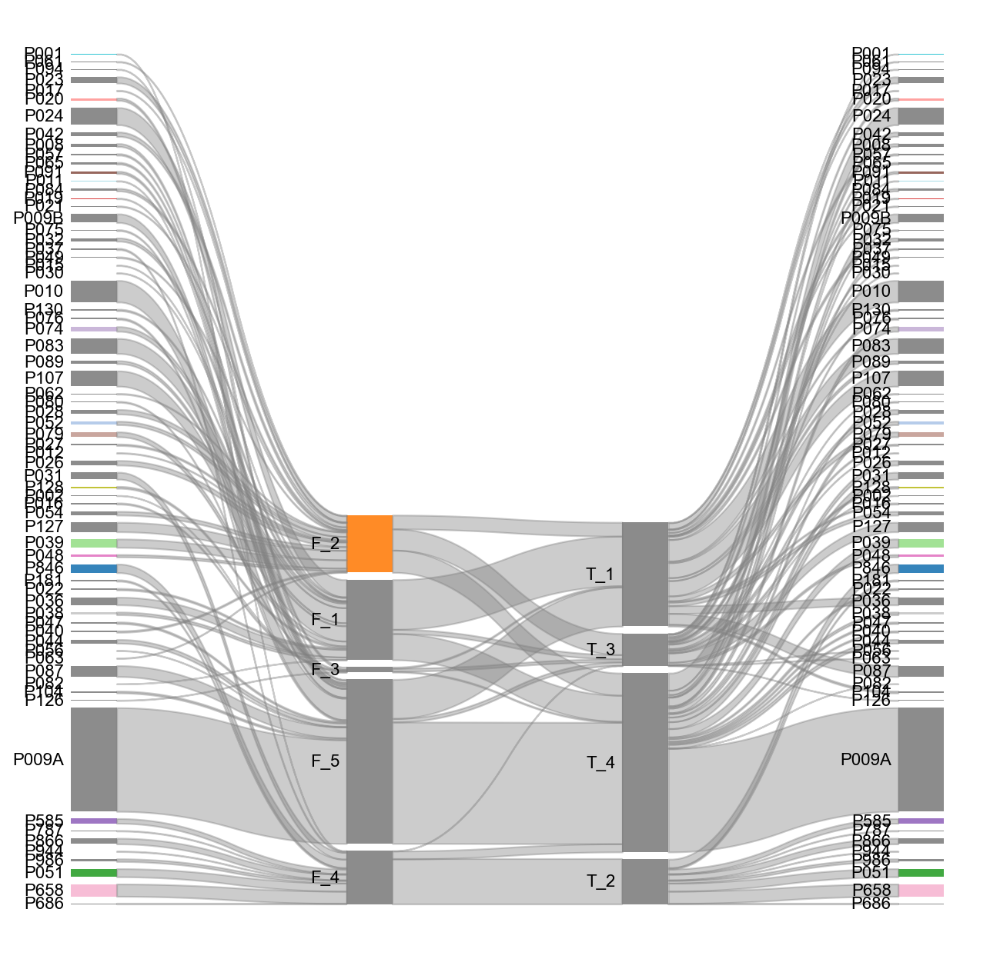

In [19]:
df_1 = df[['patient','Fibro_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("Fibro_group_tumor_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

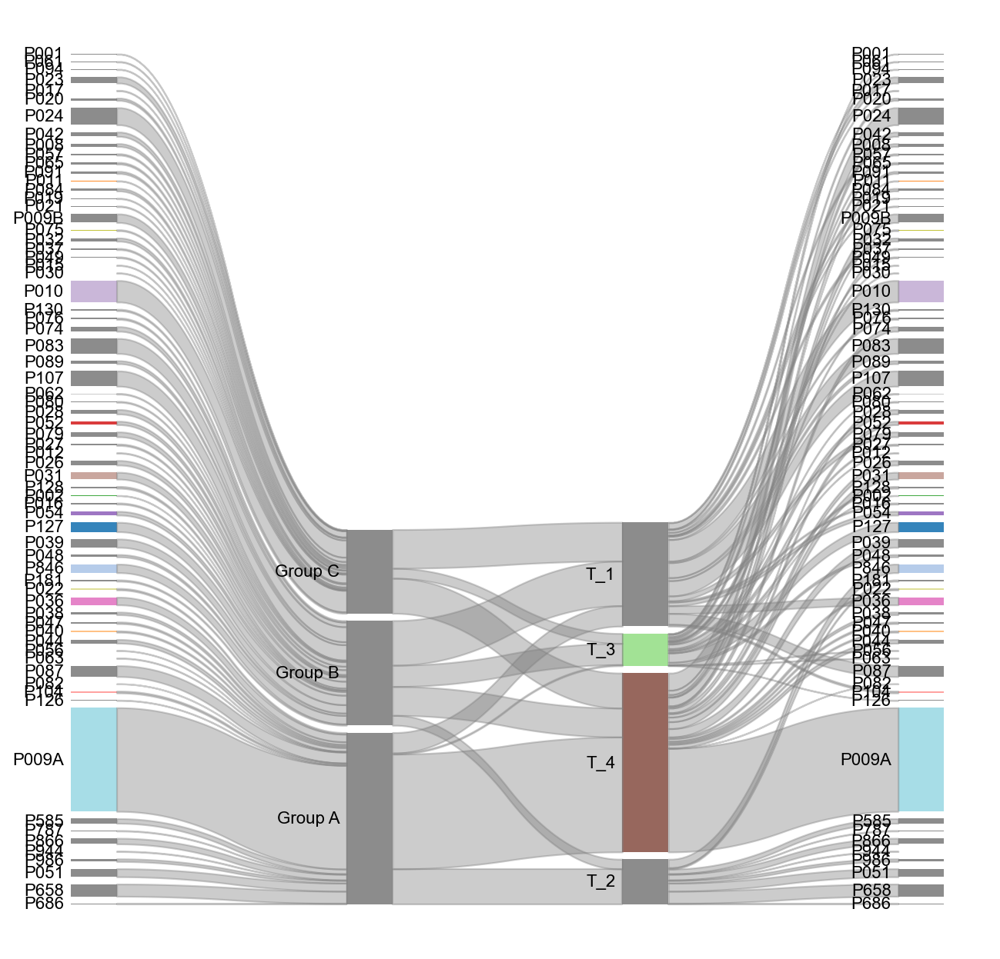

In [20]:
df_1 = df[['patient','patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_group_tumor_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

# Sankey plot with T cells (with Fibroblast classification)

In [21]:
adata_T = sc.read('T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [22]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P019','P017','P054','P036','P023','P032','P016','P104','P087','P094',
                          'P084','P079','P107','P076','P089','P083'],
             'T_2': [ 'P986','P051','P181','P944','P787','P686','P658','P846','P585','P866'],
             'T_3': ['P049','P020','P062','P062','P130','P061','P012','P057','P015','P065','P063','P056','P030',
                          'P128','P048','P002','P127','P126','P001','P028','P027'],
             'T_4': ['P037','P031','P026','P042','P040','P039','P011','P080','P075','P091',
                    'P009B','P052','P024','P082','P022','P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'T_patient_cluster4'] = i


In [23]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P686','P658','P846','P944','P585','P866',
                          'P787','P181','P986','P051','P130','P010'],
             
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P065',
                          'P057','P008','P062','P027','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012']
              }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [24]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ['P104','P087','P032','P016','P036','P089','P083'],
             'M1toT2': [],
             'M1toT3': ['P063','P056'],
             'M1toT4': ['P009B','P075','P011','P052','P047','P037','P091','P022','P074','P038','P082'],
             'M2toT1': ['P010'],
             'M2toT2': ['P686','P658','P846','P944','P585','P866','P787','P181','P986','P051'],
             'M2toT3': ['P130'],
             'M2toT4': [],
             'M3toT1': ['P017','P023','P107','P076','P021','P008','P094','P079','P084'],
             'M3toT2': [],
             'M3toT3': ['P048','P062','P027','P049','P065','P002','P057','P001','P061','P015'],
             'M3toT4': ['P040','P031','P044','P026','P080','P024','P042'],
             'M4toT1': ['P054','P019'],
             'M4toT2': [],
             'M4toT3': ['P128','P127','P126','P030','P028','P012','P020'],
             'M4toT4': ['P039'],
             'NoMtoT4': ['P009A']
            }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


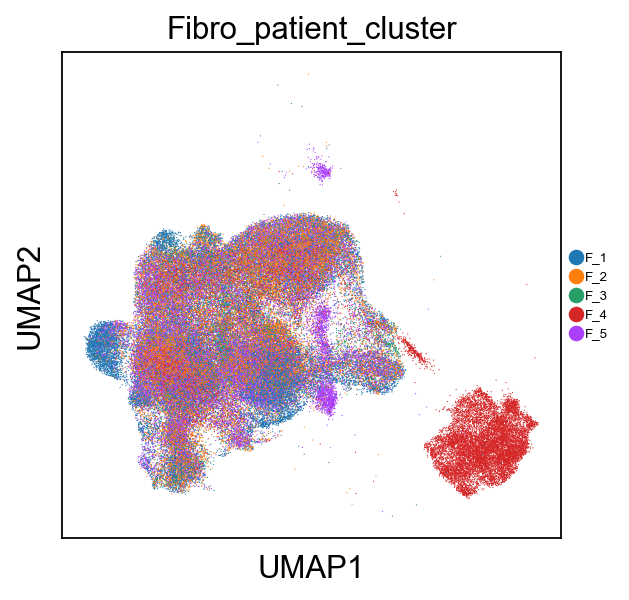

In [38]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'F_1': ['P083','P032','P107','P024','P036','P074','P089','P038','P019','P128','P082','P130','P015',
                          'P022','P030','P079'],
             'F_2': ['P054','P062','P027','P061','P048','P052','P042','P023','P084','P127','P012','P028','P039','P026',
                          'P063','P017','P040','P021','P049','P021','P049'],
             'F_3': ['P020','P080','P126','P002','P016'],
             'F_4':['P001','P037','P031','P787','P944','P051','P866','P181','P686','P846','P658','P986','P585'],
             'F_5':['P094','P065','P008','P087','P009A','P057','P104','P075','P076','P011','P056','P047','P044','P091','P010','P009B']
              }

# Initialize empty column in cell metadata
adata_T.obs['Fibro_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Fibro_patient_cluster'] = i

sc.pl.umap(adata_T, color=['Fibro_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_Fibro_patient_cluster_in_T_cell.pdf')


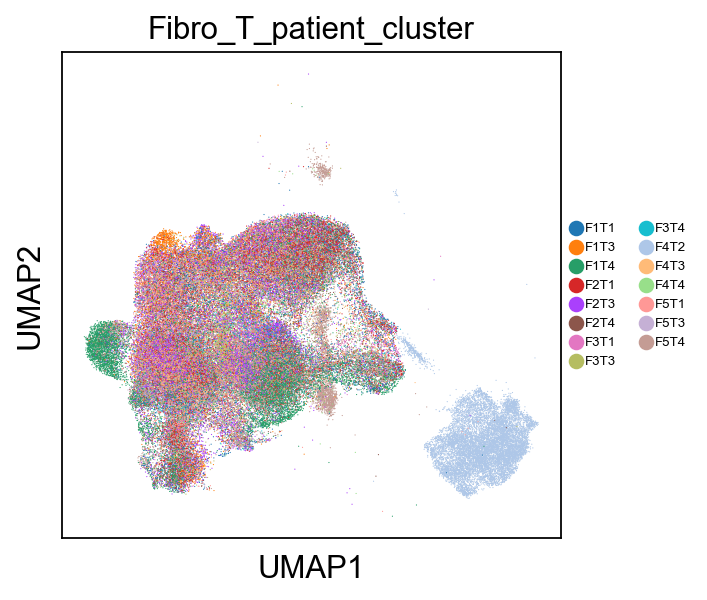

In [26]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'F1T1': ['P036','P079','P083','P089','P107','P019','P032'],
             'F1T2':[],
             'F1T3':['P128','P015','P030','P130'],
             'F1T4':['P022','P028','P038','P082','P074','P024'],
            
             'F2T1': ['P054','P017','P021','P023','P084'],
            'F2T2': [],
             'F2T3':['P063','P012','P027','P028','P048','P062','P127','P049','P061'],
             'F2T4':['P040','P026','P039','P052','P042'],
 
             'F3T1': ['P016'],
             'F3T2':[],
             'F3T3':['P020','P126','P002',],
             'F3T4':['P080'],
             
             'F4T1':[],
             'F4T2':['P787','P944','P051','P866','P181','P686','P846','P658','P986','P585'],
             'F4T3':['P001'],
             'F4T4':['P037','P031'],
             
            'F5T1':['P087','P104','P076','P008','P010','P094'],
             'F5T2':[],
             'F5T3':['P056','P057','P065'],
             'F5T4':['P009A','P044','P047','P009B','P011','P075','P091']
             
              }

# Initialize empty column in cell metadata
adata_T.obs['Fibro_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Fibro_T_patient_cluster'] = i

sc.pl.umap(adata_T, color=['Fibro_T_patient_cluster'], legend_loc='right margin', legend_fontsize=6, save='umap_Fibro_T_patient_cluster_in_T_cell.pdf')


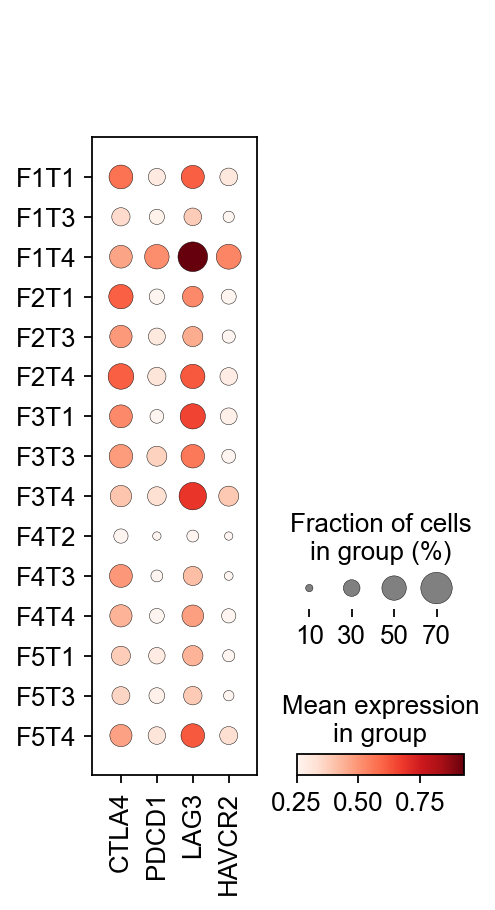

In [27]:
sc.pl.dotplot(adata_T, ['CTLA4','PDCD1','LAG3','HAVCR2'],vmin=0.25, groupby=['Fibro_T_patient_cluster'],save='exhausted_T_markers_in_T_cell_Fibro_T_group.pdf')

In [39]:
df = pd.DataFrame(adata_T.obs)
df

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,louvain,batch,total_counts_ribo,...,celltype,crude,celltype_detail,patient_cluster,T_patient_cluster,T_patient_cluster4,Myeloid_patient_cluster4,Myeloid_to_T_cluster44,Fibro_patient_cluster,Fibro_T_patient_cluster
AAACCTGAGTAGCCGA-1-0-0,3934.0,3875,1451.257568,18.802568,1.295605,tumor,P686,4,0,198.197769,...,CD8_T_cell_1,T cell,CD8 T cell,Group A,NaN,T_2,Myeloid_2,M2toT2,F_4,F4T2
AAACCTGCAAGAGGCT-1-0-0,674.0,668,882.023010,11.229170,1.273115,tumor,P686,4,0,213.666718,...,CD8_T_cell_1,T cell,CD8 T cell,Group A,NaN,T_2,Myeloid_2,M2toT2,F_4,F4T2
AAACCTGCAGTATCTG-1-0-0,1014.0,1000,954.569214,18.788149,1.968233,tumor,P686,4,0,221.148575,...,CD8_T_cell_1,T cell,CD8 T cell,Group A,NaN,T_2,Myeloid_2,M2toT2,F_4,F4T2
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,4,0,176.360626,...,CD8_T_cell_1,T cell,CD8 T cell,Group A,NaN,T_2,Myeloid_2,M2toT2,F_4,F4T2
AAACCTGGTGCGCTTG-1-0-0,786.0,773,877.295288,18.123993,2.065894,tumor,P686,4,0,217.813019,...,CD8_T_cell_1,T cell,CD8 T cell,Group A,NaN,T_2,Myeloid_2,M2toT2,F_4,F4T2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCAAATCA-1-24-2,1375.0,1348,1473.825562,22.369625,1.517793,tumor,P001,2,2,184.743835,...,Teff_1,T cell,effector T cell,Group C,NaN,T_3,Myeloid_3,M3toT3,F_4,F4T3
TTTGGTTAGTGGTAAT-1-24-2,1606.0,1572,1479.705078,29.242380,1.976230,tumor,P001,0,2,188.684555,...,CD4_T_cell_1,T cell,CD4 T cell,Group C,NaN,T_3,Myeloid_3,M3toT3,F_4,F4T3
TTTGGTTCAAGCCATT-1-24-2,4456.0,4321,1865.612427,29.546848,1.583761,tumor,P001,0,2,172.502136,...,CD4_T_cell_1,T cell,CD4 T cell,Group C,NaN,T_3,Myeloid_3,M3toT3,F_4,F4T3
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2634,1966.213501,24.433256,1.242655,tumor,P001,7,2,120.637726,...,Texh_2,T cell,exhausted T cell,Group C,NaN,T_3,Myeloid_3,M3toT3,F_4,F4T3


In [29]:
print (df.dtypes)

n_genes                      float64
n_genes_by_counts              int32
total_counts                 float32
total_counts_mt              float32
pct_counts_mt                float32
tissue                      category
patient                     category
louvain                     category
batch                       category
total_counts_ribo            float32
pct_counts_ribo              float32
total_counts_hb              float32
pct_counts_hb                float32
percent_mt2                  float32
n_counts                     float32
celltype                    category
crude                       category
celltype_detail             category
patient_cluster             category
T_patient_cluster            float64
T_patient_cluster4          category
Myeloid_patient_cluster4    category
Myeloid_to_T_cluster44      category
Fibro_patient_cluster        float64
Fibro_T_patient_cluster     category
dtype: object


In [30]:
df['patient'] = df['patient'].astype(object)
df['crude'] = df['crude'].astype(object)
df['louvain'] = df['louvain'].astype(object)
df['patient_cluster'] = df['patient_cluster'].astype(object)
df['T_patient_cluster'] = df['T_patient_cluster'].astype(object)
df['T_patient_cluster4'] = df['T_patient_cluster4'].astype(object)
df['Fibro_patient_cluster'] = df['Fibro_patient_cluster'].astype(object)
df['Fibro_T_patient_cluster'] = df['Fibro_T_patient_cluster'].astype(object)
df['Myeloid_to_T_cluster44'] = df['Myeloid_to_T_cluster44'].astype(object)
df['celltype'] = df['celltype'].astype(object)
df['batch'] = df['batch'].astype(object)


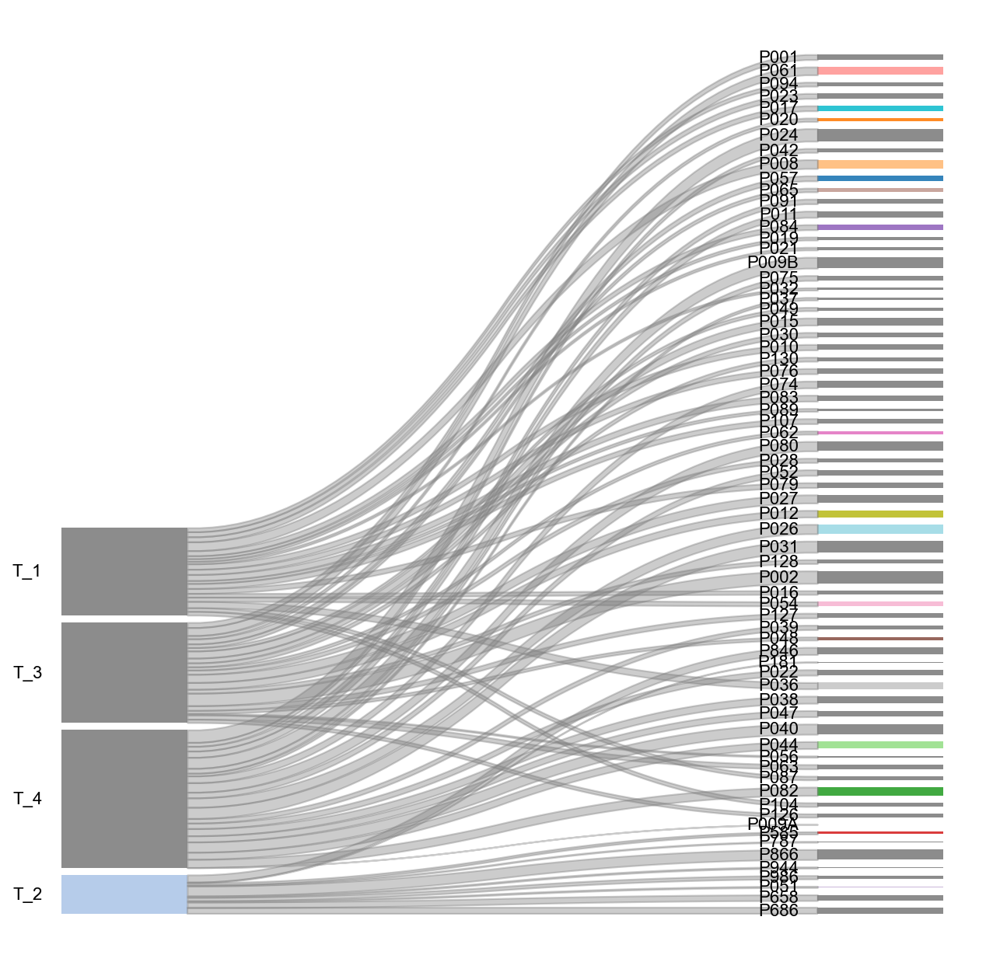

In [31]:
#pySnakey2 package
# for multilayer dataframe
import matplotlib.pyplot as plt
import pandas as pd
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf
from pysankey2 import Sankey

df_1 = df[['Fibro_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_Fibro_group_Tcell_group_comparison.pdf", bbox_inches="tight", dpi=300)

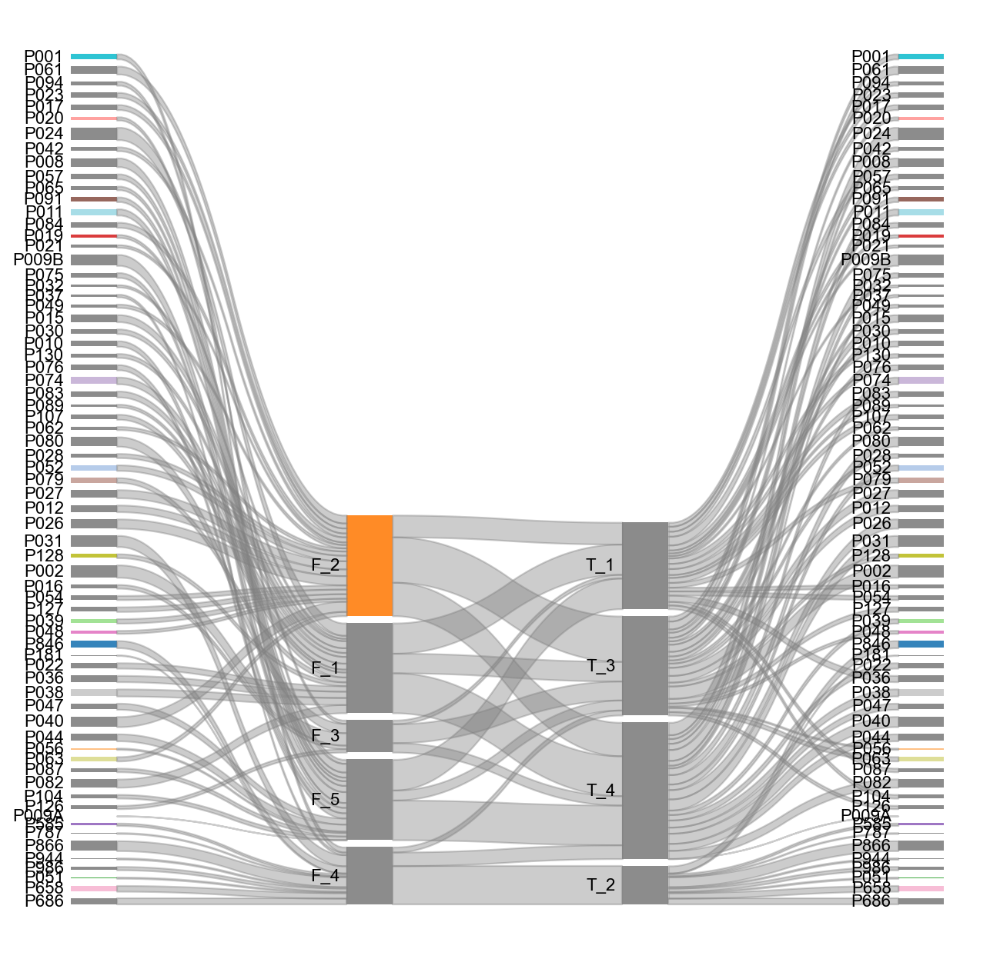

In [40]:
df_1 = df[['patient','Fibro_patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_Fibro_group_Tcell_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

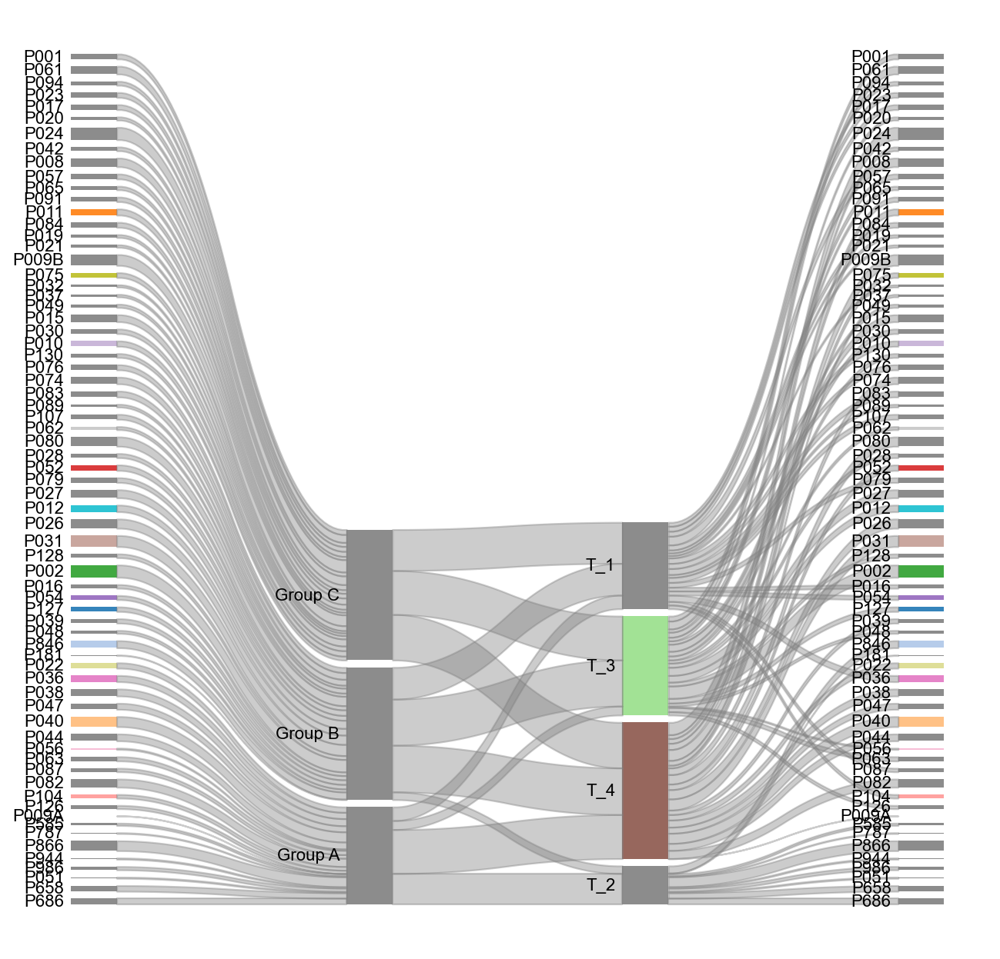

In [33]:
df_1 = df[['patient','patient_cluster','T_patient_cluster4','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("T_cell_tumor_group_Tcell_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

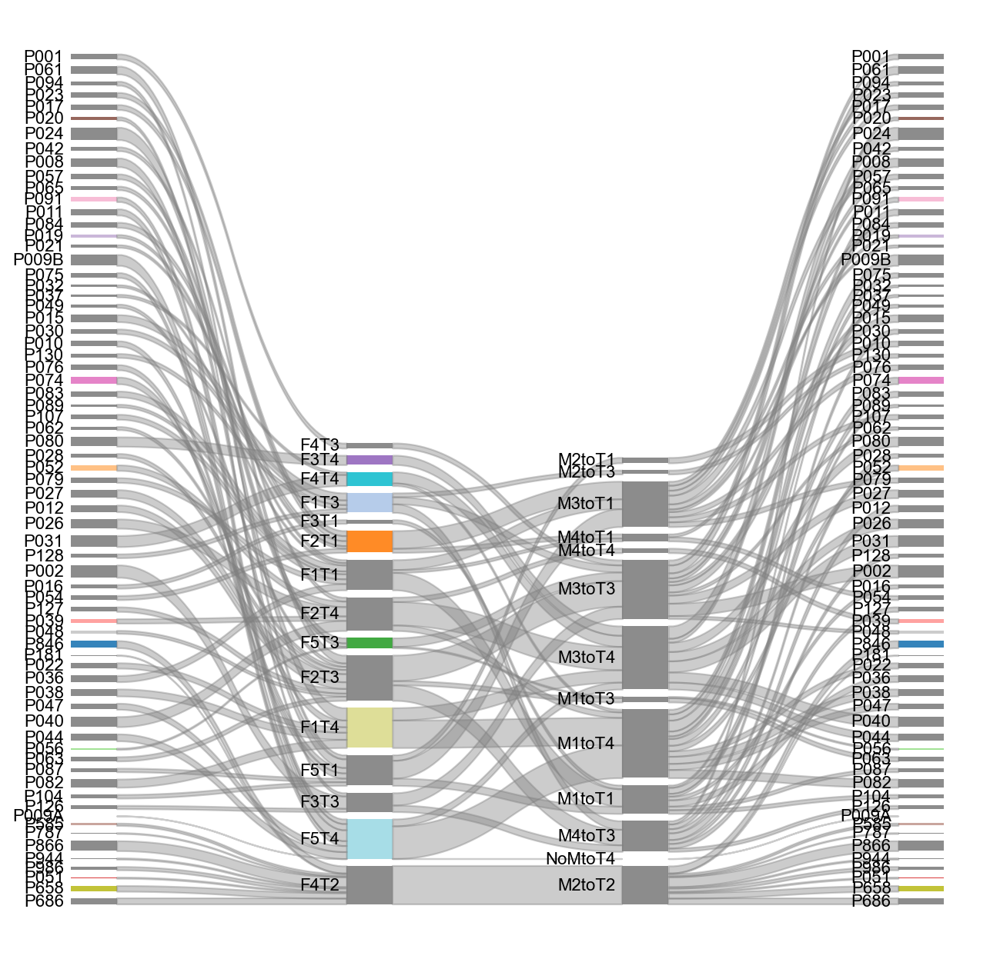

In [34]:
df_1 = df[['patient','Fibro_T_patient_cluster','Myeloid_to_T_cluster44','patient']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("paitent_Fibro_T_group_Myeloid_T_group_comparison_1.pdf", bbox_inches="tight", dpi=300)

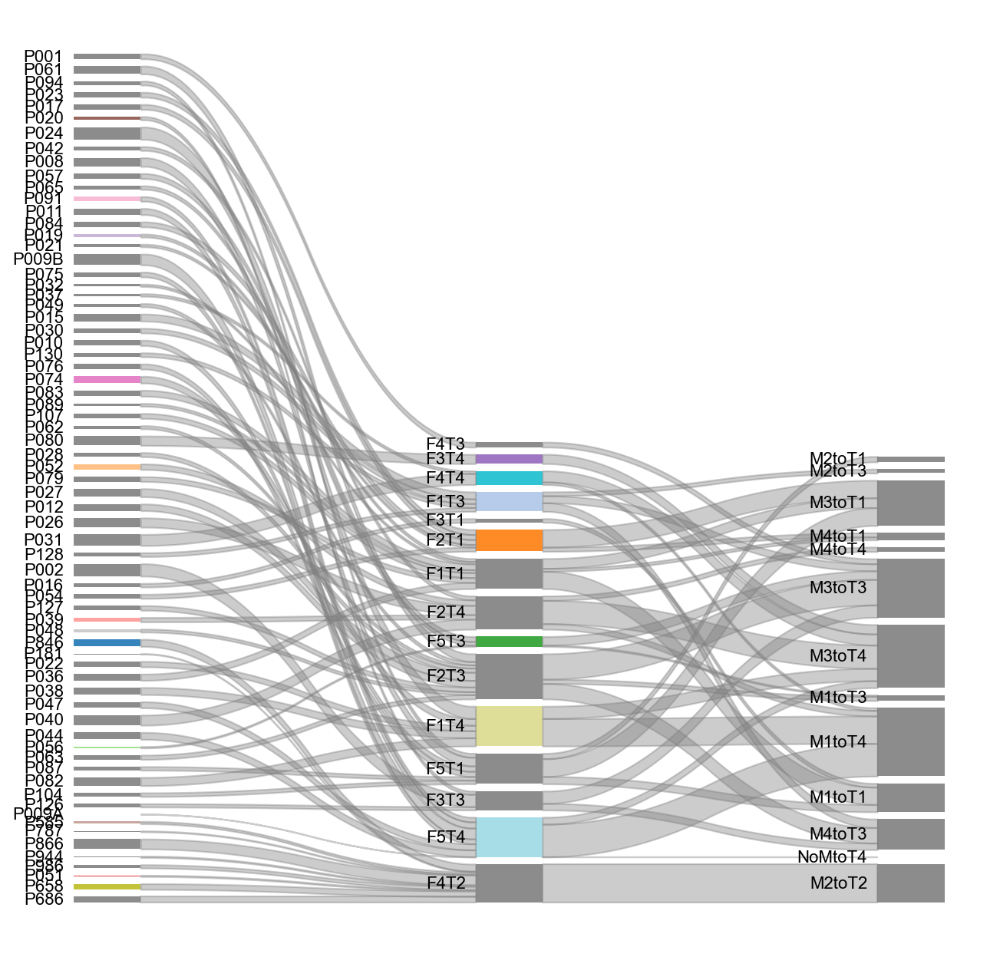

In [35]:
df_1 = df[['patient','Fibro_T_patient_cluster','Myeloid_to_T_cluster44']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("paitent_Fibro_T_group_Myeloid_T_group_comparison.pdf", bbox_inches="tight", dpi=300)

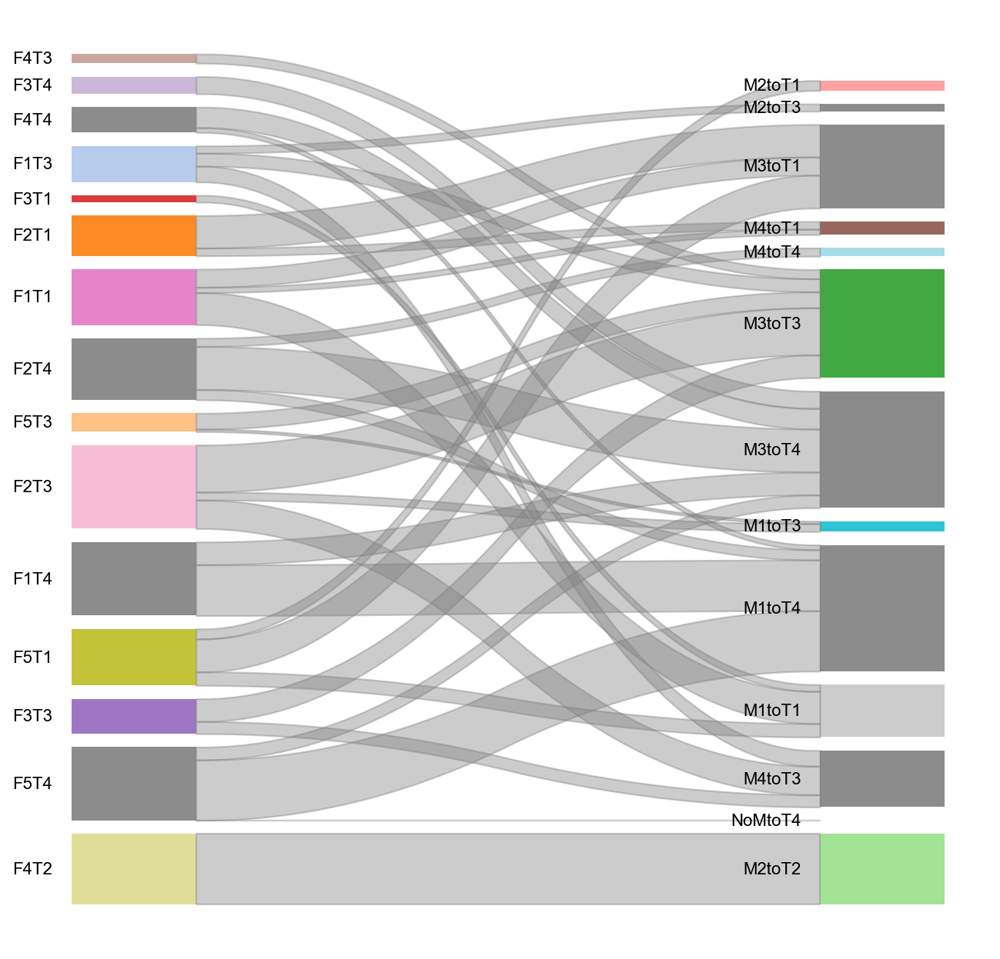

In [36]:
df_1 = df[['Fibro_T_patient_cluster','Myeloid_to_T_cluster44']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("Fibro_T_group_Myeloid_T_group_comparison_T_cells.pdf", bbox_inches="tight", dpi=300)

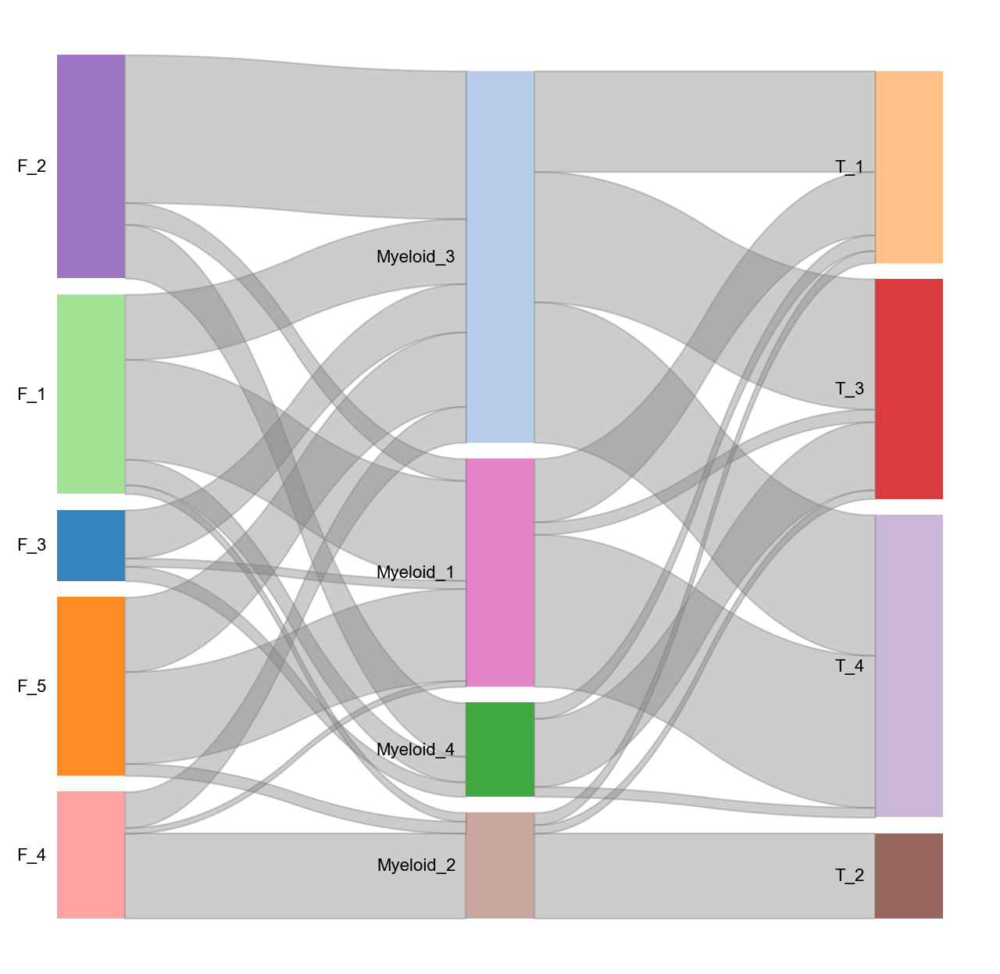

In [46]:
df_1 = df[['Fibro_patient_cluster','Myeloid_patient_cluster4','T_patient_cluster4']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("Fibro_Myeloid_T_group_in_T_cells.pdf", bbox_inches="tight", dpi=300)

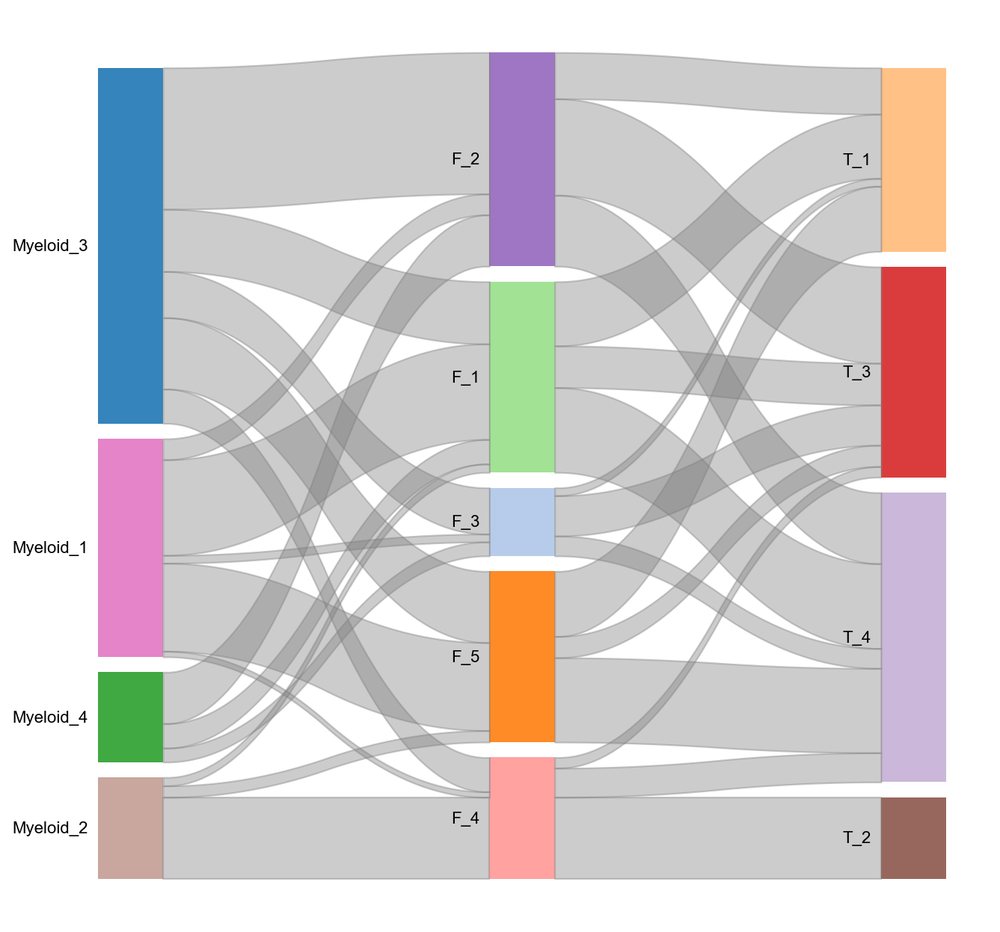

In [47]:
df_1 = df[['Myeloid_patient_cluster4','Fibro_patient_cluster','T_patient_cluster4']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("Fibro_Myeloid_T_group_in_T_cells_1.pdf", bbox_inches="tight", dpi=300)

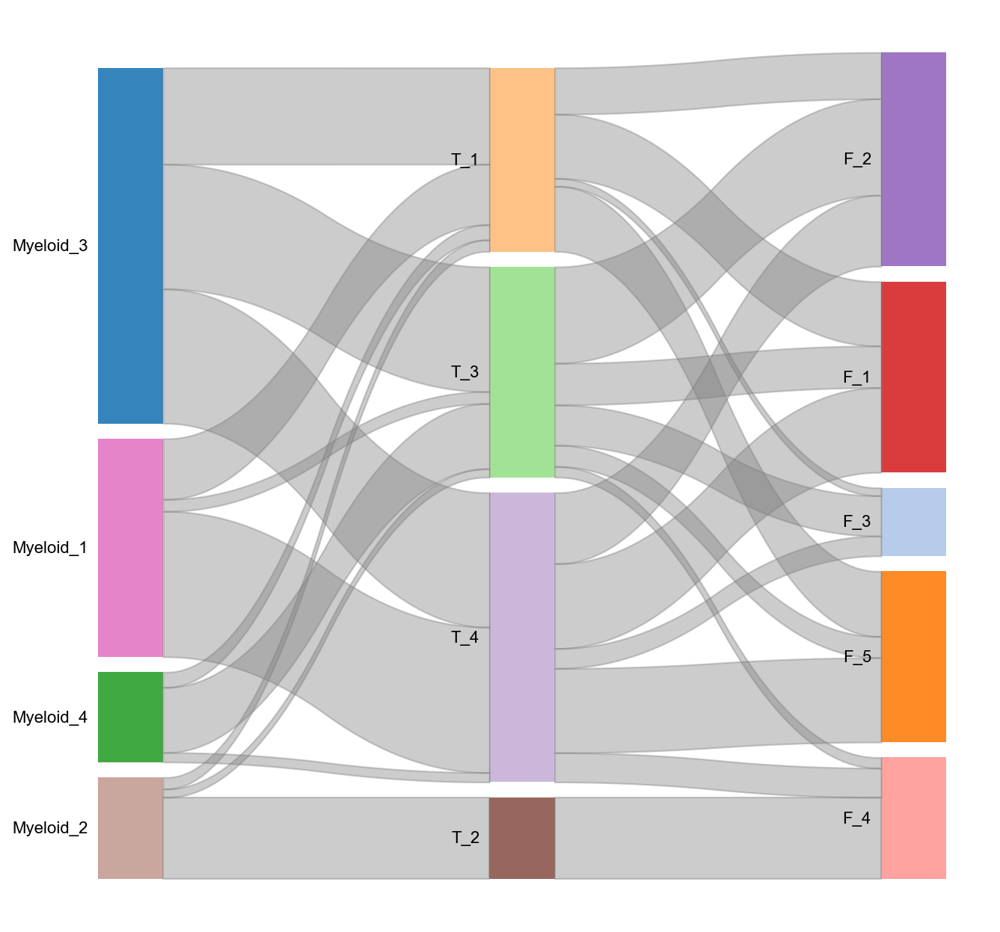

In [45]:
df_1 = df[['Myeloid_patient_cluster4','T_patient_cluster4','Fibro_patient_cluster']]
sky_auto_global_colors = Sankey(df_1,colorMode="global")#,stripColor='left')
fig,ax = sky_auto_global_colors.plot()

# Get current figure
fig = plt.gcf()

# Set size in inches
fig.set_size_inches(10, 10)

# Set the color of the background to white
fig.set_facecolor("w")

# Save the figure
fig.savefig("Fibro_Myeloid_T_group_in_T_cells_2.pdf", bbox_inches="tight", dpi=300)